# 0. **Project Abstract:**
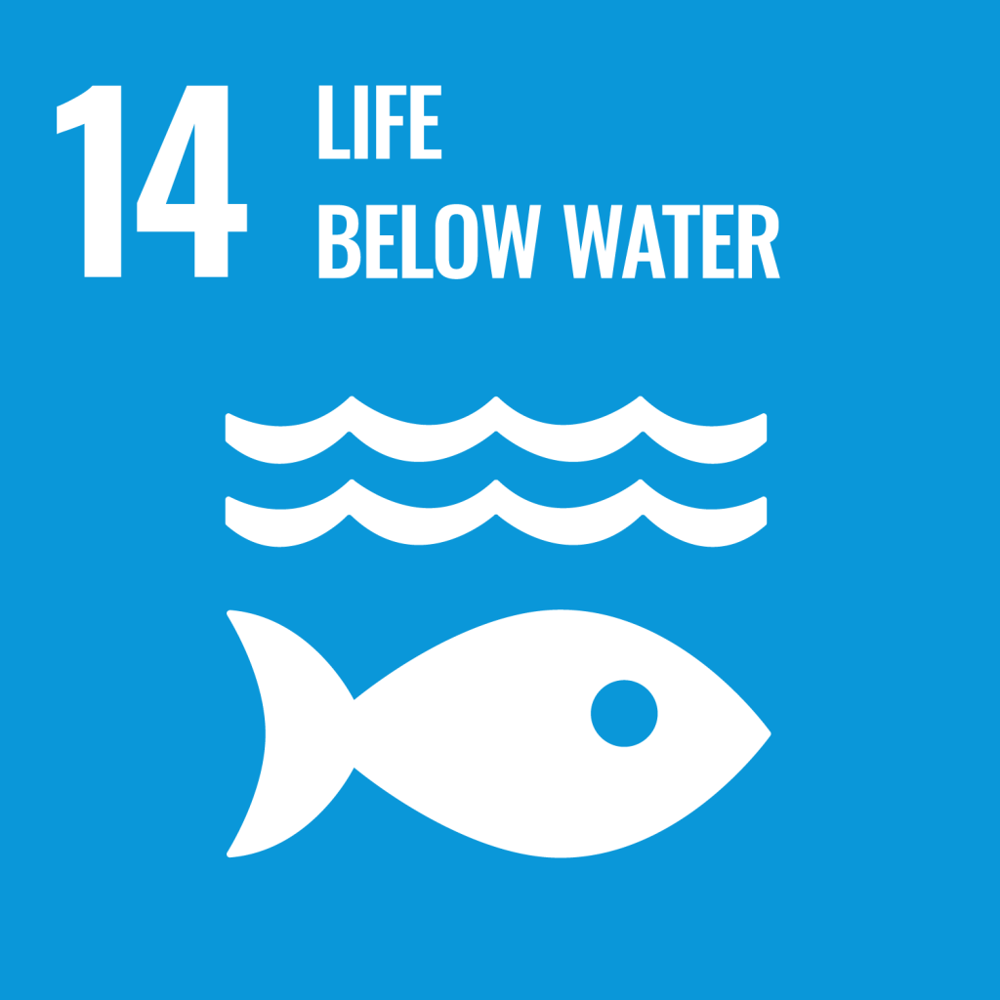

*Image source: 2022-2025 Sustainability@UKM*

>  **Title:** *Endangered Fishes Dataset*

### **Acknowledgement:**
> This dataset is associated with the following publication: Griffith, M., L. Zheng, and S. Cormier. Using extirpation to evaluate ionic tolerance of freshwater fish. ENVIRONMENTAL TOXICOLOGY AND CHEMISTRY. Society of Environmental Toxicology and Chemistry, Pensacola, FL, USA, 37(3): 871-883, (2018).
[Kaggle's Dataset Source Link](https://www.kaggle.com/datasets/harshithgupta/endangered-fish-data?select=Combined_Less.csv)


This project, submitted for the UMDAC DataHacks 2025 competition, addresses **Sustainable Development Goal (SDG) 14: Life Below Water**, which seeks to conserve and sustainably use oceans, seas and marine resources.

Using open *Endangered Fishes Dataset* via Kaggle, we apply Data Preprocessing, Exploratory Data Analysis (with additional self developed AI Data Analysis Agent, utilizing LLM and Pandas Query Engine), featuring engineering and machine learning to analyze key indicators such as chemical pollution level, fish species, metal polution level, pH value level and etc.

The goal is to derive actionable insights and build predictive model that aid in early detection of harmful trends like external pollutants that may leads to marine speciess decline. This project is both technical prototype abd a data story telling tool that support supports awareness, advpcacy and research aligned with **SDG 14: Life Below Water**.



> **Hokkien Mee is Black**



## 0.1 Data importing

The cells below prompts to upload a `kaggle.json` file, which contains **Kaggle API key**. It is needed to fetch datasets from Kaggle into Goole Colab without manually download the file into local device's storage that may lead to locaL storage wastage.

In [ ]:
from google.colab import files
files.upload()

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download harshithgupta/endangered-fish-data

## 0.2 Extracting data

Extracts the .zip file. Loads the dataset (Combined_Less.csv) and metadata into separated pandas Dataframes `df` and `df_metadata`.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
import zipfile
import pandas as pd

zip_path = '/content/endangered-fish-data.zip'

with zipfile.ZipFile(zip_path) as z:
    print(z.namelist())

    with z.open('Combined_Less.csv') as f:
        df = pd.read_csv(f)
    with z.open('Fish Conductivity Column Metadata.xlsx') as f:
        df_metadata = pd.read_excel(f)

['Combined_Less.csv', 'Fish Conductivity Column Metadata.xlsx']


<ipython-input-29-94521f09788a>:10: DtypeWarning:

Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.



In [ ]:
df.columns

Index(['species', 'state', 'HUCName', 'Common_Name', 'Dataset', 'Station_Date',
       'SITE_ID', 'YEAR', 'month', 'ECOREGL3', 'LAT_DD', 'LON_DD', 'HUC',
       'BigHUC', 'FE', 'MN', 'PHSTVL', 'COND', 'TP', 'CA', 'SO4', 'NO3', 'CL',
       'alk', 'do', 'Temp', 'rbpscore', 'GENUS', 'ABUND', 'SUMCOUNT',
       'NUMSPEC', 'NSBENT_INV', 'NSBENT_INV_NONTOL', 'NSINTOL', 'PINTOL',
       'PBENT_INV', 'PBENT_INV_NONTOL', 'WS_AREA', 'LWSKM2', 'abent_inv',
       'abent_inv_nontol', 'aintol', 'ns_DarScuMad', 'ab_DarScuMad',
       'p_DarScuMad', 'Station_Year', 'lcond', 'SO4HCO3', 'ratio', 'TotCount',
       'RA', 'FOR_TOT', 'hardness', 'Fecal_Coliform', 'xembed', 'pct_safn',
       'VISIT_NO', 'num', 'mg', 'na', 'k', 'hco3', 'tn', 'al', 'Se', 'Cadmium',
       'Calcium'],
      dtype='object')

## 0.3 Showing dataset metadata description

Begins constructing an interactive HTML-like table using `Plotly` to display a structured summary of the dataset columns and their descriptions. This helps in documenting each feature — good for presentations and dashboards.

In [ ]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Table(
    header=dict(
        values=["<b>Column Heading</b>", "<b>Description</b>"],
        fill_color='lightblue',
        align='left'
    ),
    cells=dict(
        values=[df_metadata['Column Heading'], df_metadata['Description']],
        fill_color='white',
        align='left',
        height=30  # Adjust row height for readability
    )
)])

fig.update_layout(
    title="Dataset Column Metadata",
    width=1000,
    height=1200  # Tall enough to show most or all rows
)

fig.show()


# 1. Data Preprocessing
In this section, we prepare the raw dataset for analysis and modeling. Data preprocessing is a crucial step to ensure data quality and improve model performance.

## 1.1 Loading the dataset
Import the datasets using pandas and perform initial inspection using `.head()` to have a brief understanding towards the dataset.

In [ ]:
df.head()

,species,state,HUCName,Common_Name,Dataset,Station_Date,SITE_ID,YEAR,month,ECOREGL3,...,num,mg,na,k,hco3,tn,al,Se,Cadmium,Calcium
0,Ambloplites rupestris,OH,NaN,Rock Bass,OH,200282_38909,200282,2006,8,70,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Campostoma anomalum,OH,NaN,Central Stoneroller,OH,200282_38909,200282,2006,8,70,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Catostomus commersonii,OH,NaN,White Sucker,OH,200282_38909,200282,2006,8,70,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Chrosomus erythrogaster,OH,NaN,South. Redbelly Dace,OH,200282_38909,200282,2006,8,70,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Clinostomus funduloides,OH,NaN,Rosyside Dace,OH,200282_38909,200282,2006,8,70,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## 1.2 Handling Missing Values
Identify and deal with missing value. In our case we targeted to remove the entire column that consists of more than 50% null values. For code resuability, scalability and readability, we will drop that particular columns in our **pipeline** during *3.0 Model Training*.

In [ ]:
print('The length of the dataset is : ',len(df))
for col in df.columns :
  print('Column ',col,' has ',df[col].isna().sum(),' null values')

The length of the dataset is :  42336
Column  species  has  0  null values
Column  state  has  0  null values
Column  HUCName  has  459  null values
Column  Common_Name  has  9757  null values
Column  Dataset  has  0  null values
Column  Station_Date  has  0  null values
Column  SITE_ID  has  0  null values
Column  YEAR  has  0  null values
Column  month  has  0  null values
Column  ECOREGL3  has  0  null values
Column  LAT_DD  has  117  null values
Column  LON_DD  has  117  null values
Column  HUC  has  0  null values
Column  BigHUC  has  0  null values
Column  FE  has  37436  null values
Column  MN  has  37460  null values
Column  PHSTVL  has  781  null values
Column  COND  has  0  null values
Column  TP  has  35023  null values
Column  CA  has  21048  null values
Column  SO4  has  22112  null values
Column  NO3  has  20052  null values
Column  CL  has  20916  null values
Column  alk  has  22416  null values
Column  do  has  31133  null values
Column  Temp  has  16370  null values
Co

In [ ]:
threshold = len(df) * 0.5
df_to_show_corr = df.dropna(axis=1, thresh=threshold)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42336 entries, 0 to 42335
Data columns (total 67 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   species            42336 non-null  object 
 1   state              42336 non-null  object 
 2   HUCName            41877 non-null  object 
 3   Common_Name        32579 non-null  object 
 4   Dataset            42336 non-null  object 
 5   Station_Date       42336 non-null  object 
 6   SITE_ID            42336 non-null  object 
 7   YEAR               42336 non-null  int64  
 8   month              42336 non-null  int64  
 9   ECOREGL3           42336 non-null  int64  
 10  LAT_DD             42219 non-null  float64
 11  LON_DD             42219 non-null  float64
 12  HUC                42336 non-null  int64  
 13  BigHUC             42336 non-null  int64  
 14  FE                 4900 non-null   float64
 15  MN                 4876 non-null   float64
 16  PHSTVL             415

In [ ]:
for _,row in df_metadata.iterrows():

  print(row['Column Heading'],'--',row['Description'],'\n')

species -- Species names 

state -- State 

HUCName -- Hydrologic unit name 

Common_Name -- Common_Name 

Dataset -- Data sources 

Station_Date -- StationID + Sampling Date 

SITE_ID -- Station Identifier 

YEAR -- Year 

month -- Month (from date) 

ECOREGL3 -- Level 3 ecoregion 

LAT_DD -- Decimal degree latitude 

LON_DD -- Decimal degree longitude 

HUC -- Hydrologic unit 

BigHUC -- HUC4 unit 

FE -- Iron (mg/L) 

MN -- Manganese (mg/L) 

PHSTVL -- standard pH 

COND -- Conductivity (µS/cm) 

TP -- Total Phosphorus 

CA -- Calcium (mg/L) 

SO4 -- SO4 (mg/L) 

NO3 -- Nitrite (mg/L) 

CL -- Chloride (Cl mg/L) 

alk -- Alkalinity 

do -- Dissolved Oxygen 

Temp -- Water Temperature (°C) 

rbpscore -- RBP habitat score 

GENUS -- Genus 

ABUND -- abundance 

SUMCOUNT -- Total Count 

NUMSPEC -- Number of species 

NSBENT_INV -- Number of native benthic invertivore species 

NSBENT_INV_NONTOL -- Number of native, non-tolerant benthic invertivore species 

NSINTOL -- Number of intoler

## 1.3 Separate into different Dataframe

As there is around ***70 columns*** in this dataset , we attempted to separate the dataset into several dataframes for better usability for the upcoming data analysis and data manipulating.

In [ ]:
df_site = df[[
    'SITE_ID', 'Station_Date', 'YEAR', 'month', 'Station_Year',
    'VISIT_NO', 'state', 'HUCName', 'HUC', 'BigHUC', 'ECOREGL3',
    'LAT_DD', 'LON_DD', 'Dataset'
]]

df_species = df[[
    'species', 'Common_Name', 'GENUS', 'ABUND', 'SUMCOUNT',
    'NUMSPEC', 'TotCount', 'RA'
]]

df_water_quality = df[[
    'PHSTVL', 'COND', 'lcond', 'Temp', 'do', 'TP', 'tn', 'NO3', 'SO4',
    'CL', 'alk', 'CA', 'mg', 'na', 'k', 'hco3', 'hardness',
    'Fecal_Coliform', 'SO4HCO3', 'ratio', 'Se', 'Cadmium', 'Calcium', 'al'
]]

df_habitat = df[[
    'rbpscore', 'WS_AREA', 'LWSKM2', 'xembed', 'pct_safn', 'FOR_TOT'
]]

df_invertebrates = df[[
    'NSBENT_INV', 'NSBENT_INV_NONTOL', 'NSINTOL', 'PINTOL',
    'PBENT_INV', 'PBENT_INV_NONTOL', 'abent_inv', 'abent_inv_nontol',
    'aintol'
]]

df_sensitive_taxa = df[[
    'ns_DarScuMad', 'ab_DarScuMad', 'p_DarScuMad'
]]


df_misc = df[[
    'FE', 'MN', 'num'
]]

## 1.4 Correlation Matrix
Correlation matrix used to summarize a large data set and to identify patterns and make a decision according to it.
*   Correlation values closed to -1 and 1 indicates a strong correlation between specific colums.


*   Correlation values closed to 0 indicates a weak correlation between specific columns.

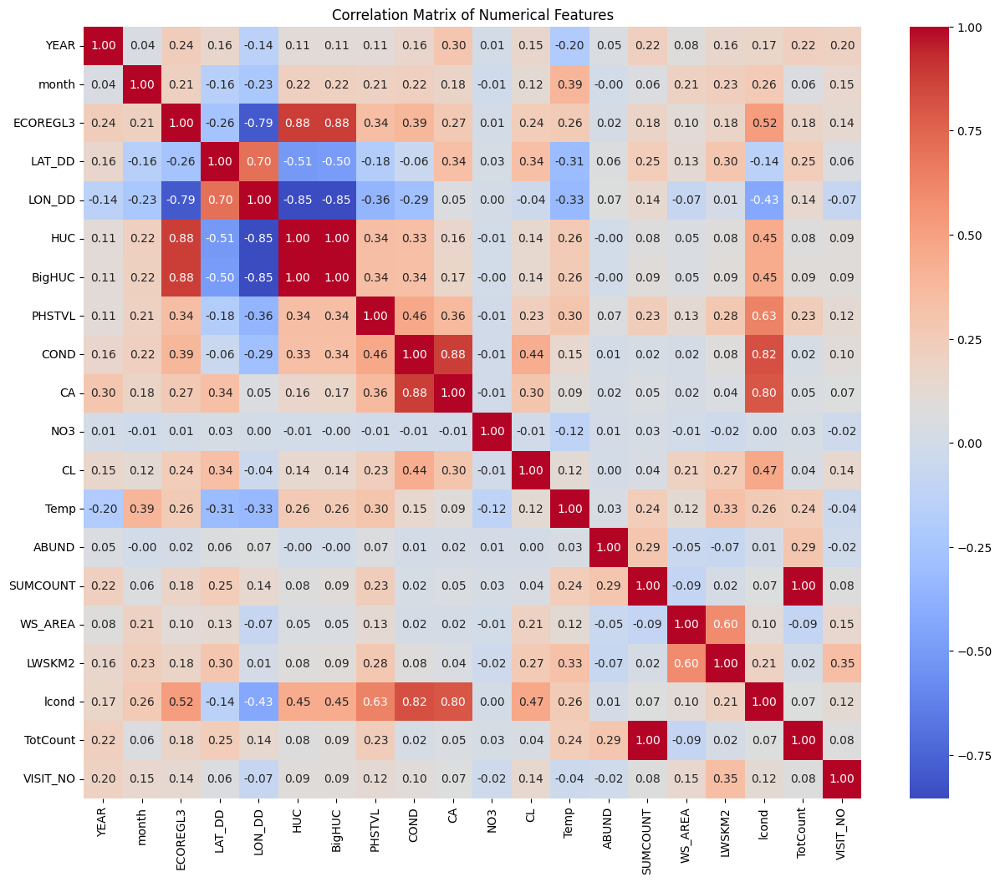

In [ ]:
num_col = df_to_show_corr.select_dtypes(include='number')

col_corr = num_col.corr()

plt.figure(figsize=(15, 12))
sns.heatmap(col_corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix of Numerical Features")
plt.show()

From the heatmap shown above , there is **redundancy** between `TotCount` and `SUMCOUNT`, between `HUC` and `BigHUC`.
To enhance model training later, we will drop `SUMCOUNT` column and `BigHUC` column.

> These two columns will be removed in the **pipeline** later as well.


# 2. Exploratory Data Analysis

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
import plotly.express as px

## 2.1 Temperature Distribution

In [ ]:
df['Temp_bin'] = pd.cut(df['Temp'], bins=30)

bin_counts = df['Temp_bin'].value_counts().sort_index().reset_index()
bin_counts.columns = ['Temp_bin', 'count']

bin_counts['Temp_bin_str'] = bin_counts['Temp_bin'].astype(str)

fig = px.bar(bin_counts, x='Temp_bin_str', y='count',
             color='count',
             color_continuous_scale='Plasma',
             title='Temperature Distribution with Colored Bins',
             labels={'Temp_bin_str': 'Temperature Range'})
fig.update_layout(xaxis_tickangle=45)
fig.show()

In [ ]:
print('The mean of the sea temperature is :',df['Temp'].mean())

The mean of the sea temperature is : 17.83446657808865


From the histogram and the calculations, we can see that the mean of sea temperature is around 18 degree celsius.

## 2.2 Interactive Spatial Mapping (Geolocation)

In this section, we explore the geographic distribution of the dataset using interactive maps. This helps uncover spatial patterns, regional concentrations, and geographic diversity in the data.

**Key Objectives:**

* **Identify and Highlight States Present in the Dataset.**
We first extract the unique U.S. states available in the dataset and visualize them on a U.S. map. This allows us to quickly see which regions are represented and which are missing from the data.

* **Map Species Occurrences by Location**
Using latitude and longitude coordinates, we plot the exact locations where species were observed or recorded. Each point on the map corresponds to a sighting or sample collection.



In [ ]:
involved_states = df['state'].unique()
highlight_df = pd.DataFrame({'state': involved_states, 'involved': 1})
print("States discovered in the dataset:\n", involved_states)

fig = px.choropleth(
    highlight_df,
    locations='state',
    locationmode='USA-states',
    color='involved',
    color_continuous_scale=[[0, 'lightgray'], [1, 'blue']],
    scope='usa',
    title='States Involved in the Dataset'
)

fig.update_layout(
    coloraxis_showscale=False,  # Hide colorbar
)

fig.show()

States discovered in the dataset:
 ['OH' 'WV' 'KY' 'PA' 'MD' 'VA' 'NJ']


The two-letter USPS abbreviations for mentioned US states are:

> **OH:** Ohio

> **WY:** Wyoming

> **KY:** Kentucky

> **PA:** Pennsylvania

> **MD:** Maryland

> **VA:** Virginia

> **NJ:** New Tersey


In [ ]:
fig = px.scatter_mapbox(df,
                        lat="LAT_DD",
                        lon="LON_DD",
                        color="state",
                        hover_name="SITE_ID",
                        zoom=5,
                        height=500)
fig.update_layout(mapbox_style="open-street-map")
fig.show()

In [ ]:
fig = px.scatter_mapbox(
    df,
    lat="LAT_DD",
    lon="LON_DD",
    color="species",
    hover_name="SITE_ID",
    hover_data={"species": True, "ABUND": True, "LAT_DD": False, "LON_DD": False},
    zoom=5,
    height=500,
    title="Species Abundance at Each Location"
)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
fig.show()

## 2.3 Exploring Interactions Among Key Water Quality Indicators by State

In [ ]:
import plotly.express as px

fig = px.scatter_matrix(df,
                        dimensions=['Temp', 'do', 'PHSTVL', 'COND'],
                        title='Scatter Matrix: Temp, DO, PHSTVL, COND',
                        color='state',
                        height=700)
fig.update_traces(diagonal_visible=True)  # Show histograms on diagonal
fig.show()

From the scatter matrix above, we observe that dissolved oxygen (DO) tends to have a negative relationship with temperature—as temperature increases, DO levels generally decrease. Additionally, DO shows a positive relationship with pH, indicating that higher pH values are often associated with higher DO levels.

#### 2.3.1 Water Quality Variables

 🌡️ Temp — Temperature (°C)
- The **water temperature** at the time of sampling.
- Affects **dissolved oxygen levels** and fish metabolism.
- Sudden changes can stress or kill aquatic life.

 🌬️ do — Dissolved Oxygen (mg/L)
- Amount of **oxygen dissolved in water**, essential for aquatic organisms.
- Low DO levels (< 5 mg/L) are harmful; < 2 mg/L is often fatal for fish.
- Influenced by temperature, plant photosynthesis, and pollution.

 🧪 PHSTVL — pH Value
- Measures the **acidity or alkalinity** of water (scale: 0–14).
  - 7 = neutral, <7 = acidic, >7 = basic.
- Most aquatic life thrives in a pH range of **6.5 to 8.5**.
- Affected by runoff, CO₂ levels, and industrial waste.

 ⚡ COND — Conductivity (μS/cm)
- Indicates water’s ability to conduct electricity, i.e., **dissolved salts and ions**.
- High values can signal pollution (e.g., fertilizers, road salt).
- Very low or high conductivity can make streams uninhabitable for fish.


## 2.4 Time Series Analysis

Yearly Trends

In [ ]:
yearly = df.groupby('YEAR')[['ABUND', 'Temp']].mean().reset_index()
fig = px.line(yearly, x='YEAR', y='ABUND', title='Average Abundance Over Years')
fig.show()

Yearly Trends by Species

In [ ]:
avg_abundance_by_year = df.groupby(['species', 'YEAR'])['ABUND'].mean().reset_index()

species_year_counts = avg_abundance_by_year['species'].value_counts()
valid_species = species_year_counts[species_year_counts >= 2].index
filtered_data = avg_abundance_by_year[avg_abundance_by_year['species'].isin(valid_species)]

fig = px.line(
    filtered_data,
    x="YEAR",
    y="ABUND",
    color="species",
    title="Average Abundance Over Years by Species",
    markers=True
)

fig.update_layout(
    xaxis_title="Year",
    yaxis_title="Average Abundance",
    legend_title="Species",
    hovermode="x unified",
    height=600
)

fig.show()

From the graph above, we can identify species showing declining abundance trends, indicating they may be at risk. Appropriate conservation actions can then be planned to help protect and preserve these vulnerable species.

Seasonal Changes

In [ ]:
fig = px.box(df, x='month', y='Temp', title='Temperature by Month',color='month')
fig.show()

## 2.5 RBP Analysis
The RBP score evaluates habitat quality based on a set of visual and physical indicators collected at stream/river sites.

In [ ]:
fig = px.violin(df, x='state', y='rbpscore', box=True, points="all",color='state',
          title='RBP Score Distribution by State')
fig.show()

<b>Purpose of RBP Score:</b>



--To quantify stream habitat health quickly.

--To support biological monitoring (e.g., fish or macroinvertebrate populations).

--To help detect impairments from pollution, land use, or erosion.</br> </br>



<b>Score Range:
Typically ranges from 0 to 200, where:</b>

160-200 = Excellent habitat condition

100-159 = Good

60-99 = Fair

<60 = Poor

In [ ]:
state_avg = df.groupby('state', as_index=False)['rbpscore'].mean()

fig = px.choropleth(state_avg,
                    locations='state',
                    locationmode='USA-states',
                    color='rbpscore',
                    color_continuous_scale='Viridis',
                    scope='usa',
                    title='Average RBP Score by State')
fig.show()

- **Ohio (OH)**: Average RBP score = 72.59  
- **New Jersey (NJ)**: Average RBP score = 91.00  
- **West Virginia (WV)**: Average RBP score = 128.74  
- **Kentucky (KY)**: Average RBP score = 130.77  
- **Pennsylvania (PA)**: Average RBP score = 137.17  
- **Virginia (VA)**: Average RBP score = 145.28  
- **Maryland (MD)**: Average RBP score = 151.75  


In [ ]:
df.columns

Index(['species', 'state', 'HUCName', 'Common_Name', 'Dataset', 'Station_Date',
       'SITE_ID', 'YEAR', 'month', 'ECOREGL3', 'LAT_DD', 'LON_DD', 'HUC',
       'BigHUC', 'FE', 'MN', 'PHSTVL', 'COND', 'TP', 'CA', 'SO4', 'NO3', 'CL',
       'alk', 'do', 'Temp', 'rbpscore', 'GENUS', 'ABUND', 'SUMCOUNT',
       'NUMSPEC', 'NSBENT_INV', 'NSBENT_INV_NONTOL', 'NSINTOL', 'PINTOL',
       'PBENT_INV', 'PBENT_INV_NONTOL', 'WS_AREA', 'LWSKM2', 'abent_inv',
       'abent_inv_nontol', 'aintol', 'ns_DarScuMad', 'ab_DarScuMad',
       'p_DarScuMad', 'Station_Year', 'lcond', 'SO4HCO3', 'ratio', 'TotCount',
       'RA', 'FOR_TOT', 'hardness', 'Fecal_Coliform', 'xembed', 'pct_safn',
       'VISIT_NO', 'num', 'mg', 'na', 'k', 'hco3', 'tn', 'al', 'Se', 'Cadmium',
       'Calcium', 'Temp_bin', 'do_plus_no3'],
      dtype='object')

In [ ]:
sum_by_state = df.groupby(['state','YEAR'])['TotCount'].sum().reset_index()
fig = px.line(
    sum_by_state,
    x="YEAR",
    y="TotCount",
    color="state",
    title="Average Abundance Over Years by State",
    markers=True
)

fig.update_layout(
    xaxis_title="Year",
    yaxis_title="Average Abundance",
    legend_title="State",
    hovermode="x unified",
    height=600
)

fig.show()

The graph indicates a sharp increase in Ohio's and MaryLand's average species abundance, followed by a steep decline in the subsequent year.

## 2.6 Outliers and Skewness Analysis
This section focuses on identifying **outliers** and measuring **skewness**, both of which can significantly impact the performance of statistical models and machine learning algorithms.

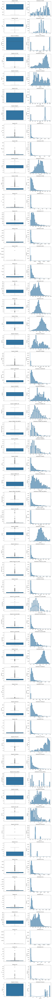

In [ ]:
numeric_cols = df.select_dtypes(include=['number']).columns

plottable_numeric_cols = [col for col in numeric_cols if df[col].notna().any()]

n_cols = 2  # One for boxplot, one for histogram
n_rows = len(plottable_numeric_cols)

if n_rows == 0:
    print("No numeric columns found with non-null values to plot.")
else:
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4 * max(n_rows, 1)))

    if n_rows == 1:
        axes = [axes]

    for i, col in enumerate(plottable_numeric_cols):
        # Boxplot (vertical)
        sns.boxplot(y=df[col].dropna(), ax=axes[i][0])
        axes[i][0].set_title(f'Boxplot of {col}')
        axes[i][0].set_ylabel(col)

        # Histogram with KDE
        sns.histplot(df[col].dropna(), kde=True, bins=30, ax=axes[i][1])
        axes[i][1].set_title(f'Distribution of {col}')
        axes[i][1].set_xlabel(col)
        axes[i][1].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()

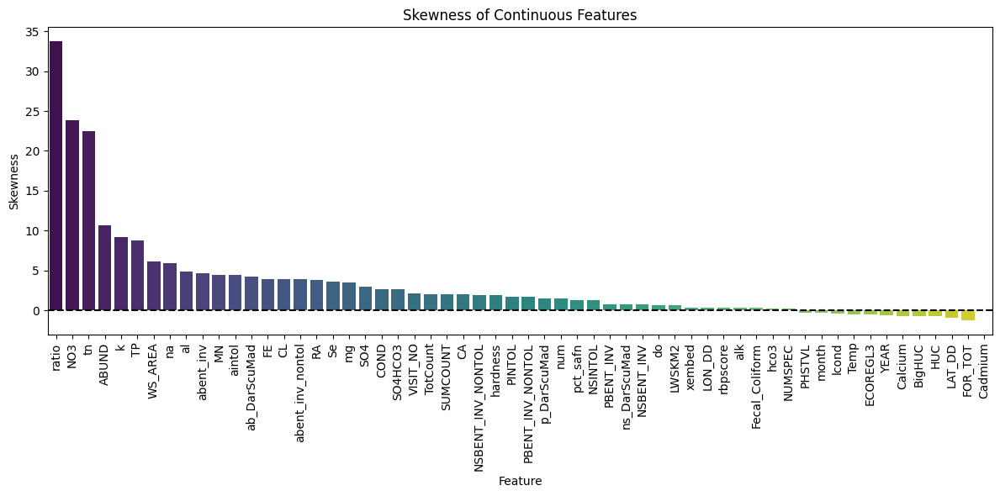

In [ ]:
skew_data = df[numeric_cols].skew().sort_values(ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x=skew_data.index, y=skew_data.values, palette="viridis",legend=False,hue=skew_data.index)
plt.title("Skewness of Continuous Features")
plt.xlabel("Feature")
plt.ylabel("Skewness")
plt.xticks(rotation=90)
plt.axhline(0, color='black', linestyle='--')
plt.xticks(rotation=90)
plt.title("Skewness of Continuous Features")
plt.ylabel("Skewness")
plt.tight_layout()
plt.show()

## 2.7 AI agent in Data Analysis
This cells section integrates a custom-built ***AI agent*** that assists users in performing automated exploratory data analysis on this dataset. The agent leverages a LLM combined with `LlamaIndex`,`Pandas Query Engine` and visualization libraries `Plotly` to support intelligent querying and interactive reporting.
<br></br>
🔍 **Key Capabilities:**
<br></br>
* **Natural Language Interface:** Users can input questions (e.g., "What features are most correlated with pollution?"), and the agent translates them into valid Pandas queries.

* **Pandas Code Generation:** Automatically generates and executes data filtering, aggregation, or statistical analysis code.

* **Data Interpretation:** Returns summary statistics, correlation values, or outlier insights as readable text.

* **Visual Insight Generation:** Plots feature-target relationships, correlation heatmaps, distribution histograms, and skewness charts using Plotly, Seaborn, and Mapbox.

* **Explainable Output:** The system not only shows results, but also explains what they mean in the context of marine health or conservation.



> Refer to the original implementation (Our previous project): [GitHub - Grab-Mex-Ai-Assistant](https://github.com/Marcusng88/Grab-Mex-Ai-Assistant)



> See the [LlamaIndex Documentation](https://docs.llamaindex.ai/en/stable/examples/query_engine/pandas_query_engine/) for details on Pandas Query Engine operations.

> Direct to [Google AI Studio](https://aistudio.google.com/app/apikey) to get your own API key, the LLM model used in this notebook is *Gemma-3*, an open source LLM developed by *Google.Inc* which is free of charge.


In [ ]:
!pip install llama-index llama-index-experimental
!pip install llama_index.llms.google_genai

In [ ]:
from llama_index.core.llms import ChatMessage
import plotly.graph_objects as go
import json

import asyncio


from llama_index.core.query_pipeline import (
    QueryPipeline as QP,
    Link,
    InputComponent,
)
from llama_index.experimental.query_engine.pandas import (
    PandasInstructionParser,
)
from llama_index.core import PromptTemplate
from llama_index.llms.google_genai import GoogleGenAI


# Ensure an event loop is created
try:
    asyncio.get_running_loop()
except RuntimeError:
    asyncio.set_event_loop(asyncio.new_event_loop())

from getpass import getpass
GOOGLE_API_KEY = getpass("Enter Your Google API Key: ")

llm = GoogleGenAI(api_key=GOOGLE_API_KEY, model_name="models/gemma-3-27b-it")

def query_pipeline(df):
    instruction_str = (
        "1. Convert the query to executable Python code using Pandas.\n"
        "2. The final line of code should be a Python expression that can be called with the `eval()` function.\n"
        "3. The code sh=ould represent a solution to the query.\n"
        "4. PRINT ONLY THE EXPRESSION.\n"
        "5. Do not quote the expression.\n"
    )

    pandas_prompt_str = (
        "You are working with a pandas dataframe in Python.\n"
        "The name of the dataframe is `df`.\n"
        "This is the result of `print(df.head())`:\n"
        "{df_str}\n\n"
        "Follow these instructions:\n"
        "{instruction_str}\n"
        "Query: {query_str}\n\n"
        "Expression:"
    )
    response_synthesis_prompt_str = (
        "Given an input question,PLEASE IGNORE THE JSON VARIABLE. synthesize a response from the query results.\n"
        "You are an assistant in Data Analystic, your name is 'Hokkien Mee Black Data Analystic Assistant'\n"
        "Make it interactive and informative with minimum 125 words.\n"
        "If the user query is irrelevant to the dataset , PROVIDE THEM SOME SUGGESTION"
        "Please structure the response markdown in a proper way.(eg. Title should have bold and bigger text size, break line after title)"
        "You may add emoji in your response to make it more interactive.\n"
        "Query: {query_str}\n\n"
        "Pandas Instructions (optional):\n{pandas_instructions}\n\n"
        "Pandas Output: {pandas_output}\n\n"
        "Graph Generation Output (JSON):\n{llm3_json_output}\n\n"
        "Response: "
    )

    graph_generator_prompt_str = (
        "Given an input pandas dataframe information {pandas_output} , the input can be None\n"
        "Figure out whether this information needed to be plot as a graph or not"
        """Write it in a json format {
            plot: bool,
            graph_type: type,
            title: str,
            x_label: str,
            y_label: str,
            data_x: list,
            data_y: list,
            color: str,
        }\n"""
        """The plot is True if needed to be plot , False otherwise.
        graph_type determines which graph is needed to be plot.
        title will be the name for the graph.
        x_label is the label for x-axis.
        y_label is the label for y-axis.
        data_x is the list of data for x-axis.
        data_y is the list of data for y-axis.
        color is the color styling for the plotly graph. Please use color available for plotly\n

        """
        "Do not give other output other than the json\n"
    )

    pandas_prompt = PromptTemplate(pandas_prompt_str).partial_format(
        instruction_str=instruction_str, df_str=df.head(5)
    )
    pandas_output_parser = PandasInstructionParser(df)
    response_synthesis_prompt = PromptTemplate(response_synthesis_prompt_str)
    graph_generator_prompt = PromptTemplate(graph_generator_prompt_str)

    global qp
    qp = QP(
        modules={
            "input": InputComponent(),
            "pandas_prompt": pandas_prompt,
            "llm1": llm,
            "pandas_output_parser": pandas_output_parser,
            "response_synthesis_prompt": response_synthesis_prompt,
            "llm2": llm,
            "graph_generator_prompt": graph_generator_prompt,
            "llm3": llm,
        },
        verbose=True,
    )
    qp.add_chain(["input", "pandas_prompt", "llm1", "pandas_output_parser"])
    qp.add_links(
        [
            Link("input", "response_synthesis_prompt", dest_key="query_str"),
            Link(
                "llm1", "response_synthesis_prompt", dest_key="pandas_instructions"
            ),
            Link(
                "pandas_output_parser",
                "response_synthesis_prompt",
                dest_key="pandas_output",
            ),
        ]
    )

    qp.add_link(
        "pandas_output_parser",
        "graph_generator_prompt",
        dest_key="pandas_output"
    )

    qp.add_link(
        "graph_generator_prompt",
        "llm3"
    )
    qp.add_link(
        "llm3",
        "response_synthesis_prompt",
        dest_key="llm3_json_output"
    )
    qp.add_link("response_synthesis_prompt", "llm2")

def graph_generation(response):

  try:
        response = json.loads(response)
  except json.JSONDecodeError:
        print("Error: Invalid JSON string provided.")
        return None

  if response.get('plot'):
        graph_type = response.get('graph_type', 'scatter').lower()
        title = response.get('title', 'Generated Graph')
        x_label = response.get('x_label', 'X-axis')
        y_label = response.get('y_label', 'Y-axis')
        data_x = response.get('data_x', [])
        data_y = response.get('data_y', [])
        color = response.get('color')

        if not data_x or not data_y or len(data_x) != len(data_y):
            print("Error: Invalid or missing data for plotting.")
            return None

        df = pd.DataFrame({'x': data_x, 'y': data_y})
        if graph_type == 'scatter':
            fig = go.Figure(data=[
                go.Scatter(x=df['x'], y=df['y'],
                        mode='markers',
                        marker_color=color,
                        name=title)
            ])
        elif graph_type == 'line':
            fig = go.Figure(data=[
                go.Scatter(x=df['x'], y=df['y'],
                        mode='lines',
                        line=dict(color=color),
                        name=title)
            ])
        elif graph_type == 'bar':
            fig = go.Figure(data=[
                go.Bar(x=df['x'], y=df['y'],
                    marker_color=color,
                    name=title)
            ])
        elif graph_type == 'histogram':
            fig = go.Figure(data=[
                go.Histogram(x=df['x'],
                            marker_color=color,
                            name=title)
            ])
        else:
            # Fallback to a scatter plot with a warning.
            print(f"Warning: Graph type '{graph_type}' is not supported. Defaulting to scatter plot.")
            fig = go.Figure(data=[
                go.Scatter(x=df['x'], y=df['y'],
                        mode='markers',
                        marker_color=color,
                        name=title)
            ])

        # Update the layout with a title and axis labels.
        fig.update_layout(
            title=title,
            xaxis_title=x_label,
            yaxis_title=y_label,
            template='plotly_white'
        )
        return fig
  else:
        print("Plotting is disabled in the response.")
        return None
def agent_prompt(prompt):
  chat_history = []
  user_input = prompt
  try:
    response,x = qp.run_with_intermediates(query_str=user_input+" .You may refer the chat history "+str(chat_history),)
    chat_history.append("User input, "+user_input)
    chat_history.append("AI answer, "+response.message.content)

    graph_response_extraction = (str(x.get('llm3')).split('```'))
    graph_response = graph_response_extraction[1]
    graph_data = graph_response.replace('json', '').replace('\\n', '')
    graph = graph_generation(graph_data)
    return response.message.content, graph

  except Exception as e:
    print(f"An error occurred: {e}")
    print("Attempting to access results directly from pipeline state if possible (this depends on the specific QP implementation)")

Enter Your Google API Key: ··········


### **2.7.1 Showcase of Data Analysis AI-agent**

In [ ]:
"""User may modify this segement of code to make it user-prompt friendly"""
"""while True: ..."""

query_pipeline(df)
response, graph = agent_prompt("Show me the top 10 species.")
print(response)

if graph:
    graph.show()

print("\nComparison with actual species count:\n")
print(df['species'].value_counts().nlargest(10))

> Running module input with input: 
query_str: Show me the top 10 species. .You may refer the chat history []

> Running module pandas_prompt with input: 
query_str: Show me the top 10 species. .You may refer the chat history []

> Running module llm1 with input: 
messages: You are working with a pandas dataframe in Python.
The name of the dataframe is `df`.
This is the result of `print(df.head())`:
                   species state HUCName           Common_Name Dataset  ...

> Running module pandas_output_parser with input: 
input: assistant: df['species'].value_counts().head(10)


> Running module graph_generator_prompt with input: 
pandas_output: species
Semotilus atromaculatus    2286
Catostomus commersonii     2279
Salmo trutta               2096
Rhinichthys atratulus      2069
Salvelinus fontinalis      1743
Campostoma anomalum        1412
...

> Running module llm3 with input: 
messages: Given an input pandas dataframe information species
Semotilus atromaculatus    2286
Catostomu


Comparison with actual species count:

species
Semotilus atromaculatus    2286
Catostomus commersonii     2279
Salmo trutta               2096
Rhinichthys atratulus      2069
Salvelinus fontinalis      1743
Campostoma anomalum        1412
Hypentelium nigricans      1399
Pimephales notatus         1239
Lepomis macrochirus        1162
Ambloplites rupestris      1130
Name: count, dtype: int64


#### **2.7.1 LLM-Enabled Storytelling Capability**🧠

Since the AI agent is powered by a **LLM**, it possesses the ability to perform **automated data storytelling**, beyond conventional statistical summaries. This capability enables the agent to synthesize insights and articulate findings in natural language, providing context-aware explanations and narratives derived from the data.

Rather than relying solely on human interpretation, the *LLM offers a comprehensive and scalable alternative for insight generation.* It can highlight key patterns, anomalies, correlations, or risks in the dataset, and frame them in a manner that is understandable, insightful, and aligned with domain-specific goals—such as fish conservation under **SDG 14 (Life Below Water)**.

This LLM-powered narration makes data exploration more accessible to non-technical stakeholders while also enhancing analytical depth for domain experts.

# 3. Model training

In [ ]:
! pip install xgboost

In [ ]:
from sklearn.preprocessing import LabelEncoder, TargetEncoder, OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import root_mean_squared_error, root_mean_squared_log_error, mean_absolute_error, mean_squared_error, r2_score
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd

In [ ]:
class DropHighNaNColumns(BaseEstimator, TransformerMixin):
    def __init__(self, threshold=0.5):
        self.threshold = threshold
        self.columns_to_keep_ = None

    def fit(self, X, y=None):
        # Keep columns with non-null count >= threshold
        non_null_counts = X.notnull().sum()
        total_rows = len(X)
        self.columns_to_keep_ = non_null_counts[non_null_counts >= self.threshold * total_rows].index
        return self

    def transform(self, X):
        return X[self.columns_to_keep_]

In [ ]:
for _, row in df.iterrows():
  print(row)
  print(len(row))
  break

species        Ambloplites rupestris
state                             OH
HUCName                          NaN
Common_Name                Rock Bass
Dataset                           OH
                       ...          
al                               NaN
Se                               NaN
Cadmium                          NaN
Calcium                          NaN
Temp_bin                         NaN
Name: 0, Length: 68, dtype: object
68


In [ ]:
df.columns

Index(['species', 'state', 'HUCName', 'Common_Name', 'Dataset', 'Station_Date',
       'SITE_ID', 'YEAR', 'month', 'ECOREGL3', 'LAT_DD', 'LON_DD', 'HUC',
       'BigHUC', 'FE', 'MN', 'PHSTVL', 'COND', 'TP', 'CA', 'SO4', 'NO3', 'CL',
       'alk', 'do', 'Temp', 'rbpscore', 'GENUS', 'ABUND', 'SUMCOUNT',
       'NUMSPEC', 'NSBENT_INV', 'NSBENT_INV_NONTOL', 'NSINTOL', 'PINTOL',
       'PBENT_INV', 'PBENT_INV_NONTOL', 'WS_AREA', 'LWSKM2', 'abent_inv',
       'abent_inv_nontol', 'aintol', 'ns_DarScuMad', 'ab_DarScuMad',
       'p_DarScuMad', 'Station_Year', 'lcond', 'SO4HCO3', 'ratio', 'TotCount',
       'RA', 'FOR_TOT', 'hardness', 'Fecal_Coliform', 'xembed', 'pct_safn',
       'VISIT_NO', 'num', 'mg', 'na', 'k', 'hco3', 'tn', 'al', 'Se', 'Cadmium',
       'Calcium', 'Temp_bin'],
      dtype='object')

In [ ]:
df.dropna(subset=['TotCount'],inplace =True)

In [ ]:
X = df.drop(columns=['TotCount'])
y = df['TotCount']

In [ ]:
X_train , X_test , y_train , y_test = train_test_split(X,y,test_size=0.2,random_state=42)

num_cols = [
    'PHSTVL', 'COND', 'CA', 'NO3', 'CL', #'Temp',
    'WS_AREA', 'LWSKM2', 'lcond', #'TotCount',
    'LAT_DD', 'LON_DD', 'ECOREGL3', 'HUC', 'BigHUC',
    'YEAR', 'month','ABUND'
]

cat_cols = [
    'species', 'GENUS', 'state'
]


num_col_scaler = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

cat_col_scaler = Pipeline(steps=[
    ('adv_target_encoder', TargetEncoder())
])


preprocessing_transformer = ColumnTransformer(
    transformers=[
    ('num_cols',num_col_scaler,num_cols),
    ('cat_cols',cat_col_scaler,cat_cols)
])

In [ ]:
full_preprocessing_pipeline = Pipeline(steps=[
    ('drop_high_nan',DropHighNaNColumns(threshold=0.5)),
    ('transformer',preprocessing_transformer)
])

In [ ]:
import numpy as np
y_train = np.log1p(y_train)

In [ ]:
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.linear_model import Ridge, Lasso
from sklearn.svm import SVR
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error


In [ ]:
full_model_pipeline = Pipeline(steps=[
    ('preprocessing',full_preprocessing_pipeline),
    ('model',XGBRegressor(random_state =42,))
])
full_model_pipeline.fit(X_train,y_train)

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('drop_high_nan', DropHighNaNColumns()),
                                 ('transformer',
                                  ColumnTransformer(transformers=[('num_cols',
                                                                   Pipeline(steps=[('imputer',
                                                                                    SimpleImputer()),
                                                                                   ('scaler',
                                                                                    StandardScaler())]),
                                                                   ['PHSTVL',
                                                                    'COND',
                                                                    'CA', 'NO3',
                                                                    'CL',
                                                                    'WS_AREA',
                                                                    'LWSKM2',
                                                                    'lcond',
                                                                    'LAT_DD',
                                                                    'LON_DD',
                                                                    'ECOREGL3',
                                                                    'HUC',
                                                                    'BigHUC',
                                                                    'YEAR',
                                                                    'month',
                                                                    'ABUND']),...
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=None, n_jobs=None,
                              num_parallel_tree=None, random_state=42, ...))])

In [ ]:
y_pred = full_model_pipeline.predict(X_test)
y_pred = np.expm1(y_pred)

print('The RMSE of the model is ',root_mean_squared_error(y_test,y_pred))
print('The MSE of the model is ',mean_squared_error(y_test,y_pred))
print('The MAE of the model is ',mean_absolute_error(y_test,y_pred))
print('The R2 score of the model is ',r2_score(y_test,y_pred))
print('The RMSLE score of the model is ',root_mean_squared_log_error(y_test,y_pred))

The RMSE of the model is  158.56240339012018
The MSE of the model is  25142.035768851198
The MAE of the model is  86.54429922003753
The R2 score of the model is  0.9381554853092737
The RMSLE score of the model is  0.19618953783048435


In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'model__n_estimators': [100, 200],
    'model__max_depth': [3, 5, 7],
    'model__learning_rate': [0.01, 0.1, 0.2],
    'model__subsample': [0.8, 1.0],
    'model__colsample_bytree': [0.8, 1.0]
}

xgb_pipeline = Pipeline(steps=[
    ('preprocessing', full_preprocessing_pipeline),
    ('model', XGBRegressor(random_state=42, objective='reg:squarederror'))
])

grid_search = GridSearchCV(
    xgb_pipeline,
    param_grid=param_grid,
    cv=5,
    scoring='r2',
    n_jobs=-1,
    verbose=1
)

grid_search.fit(X_train, y_train)

print("Best R² Score: ", grid_search.best_score_)
print("Best Parameters: ", grid_search.best_params_)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best R² Score:  0.9747718457681678
Best Parameters:  {'model__colsample_bytree': 0.8, 'model__learning_rate': 0.2, 'model__max_depth': 7, 'model__n_estimators': 200, 'model__subsample': 0.8}


In [ ]:
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
y_pred = np.expm1(y_pred)

In [ ]:
df_pred = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

fig = px.scatter(
    df_pred,
    x='Actual',
    y='Predicted',
    title='Actual vs Predicted Values',
    labels={'Actual': 'Actual Values', 'Predicted': 'Predicted Values'},
    width=700,
    height=600
)

fig.add_shape(
    type='line',
    x0=0, y0=0, x1=600, y1=600,
    line=dict(color='red', dash='dash'),
)

fig.update_layout(
    xaxis=dict(range=[0, 600], zeroline=False),
    yaxis=dict(range=[0, 600], zeroline=False),
    plot_bgcolor='white',
    hovermode='closest'
)

fig.update_traces(marker=dict(size=7, color='blue', opacity=0.7))

fig.show()

In [ ]:
print('After hyperparameter tuning')
print('The RMSE of the model is ',root_mean_squared_error(y_test,y_pred))
print('The MSE of the model is ',mean_squared_error(y_test,y_pred))
print('The MAE of the model is ',mean_absolute_error(y_test,y_pred))
print('The R2 score of the model is ',r2_score(y_test,y_pred))
print('The RMSLE score of the model is ',root_mean_squared_log_error(y_test,y_pred))

After hyperparameter tuning
The RMSE of the model is  109.1192531481336
The MSE of the model is  11907.011407606464
The MAE of the model is  52.5289216015116
The R2 score of the model is  0.9707110693545079
The RMSLE score of the model is  0.13856385955135783
